<a href="https://colab.research.google.com/github/honestlyBroke/logo-detection/blob/main/logo_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Sun Jul 28 12:23:18 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   66C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.67 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.7/78.2 GB disk)


In [ ]:
!pip install roboflow

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="YOUR API KEY")
project = rf.workspace("videoverse-s3lki").project("pc-e4adv")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.67, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to pc-1 in yolov8:: 100%|██████████| 3706/3706 [00:00<00:00, 5408.19it/s]


In [ ]:
!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=20 imgsz=640

100% 49.7M/49.7M [00:00<00:00, 107MB/s] 
Ultralytics YOLOv8.2.67 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/pc-1/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, s

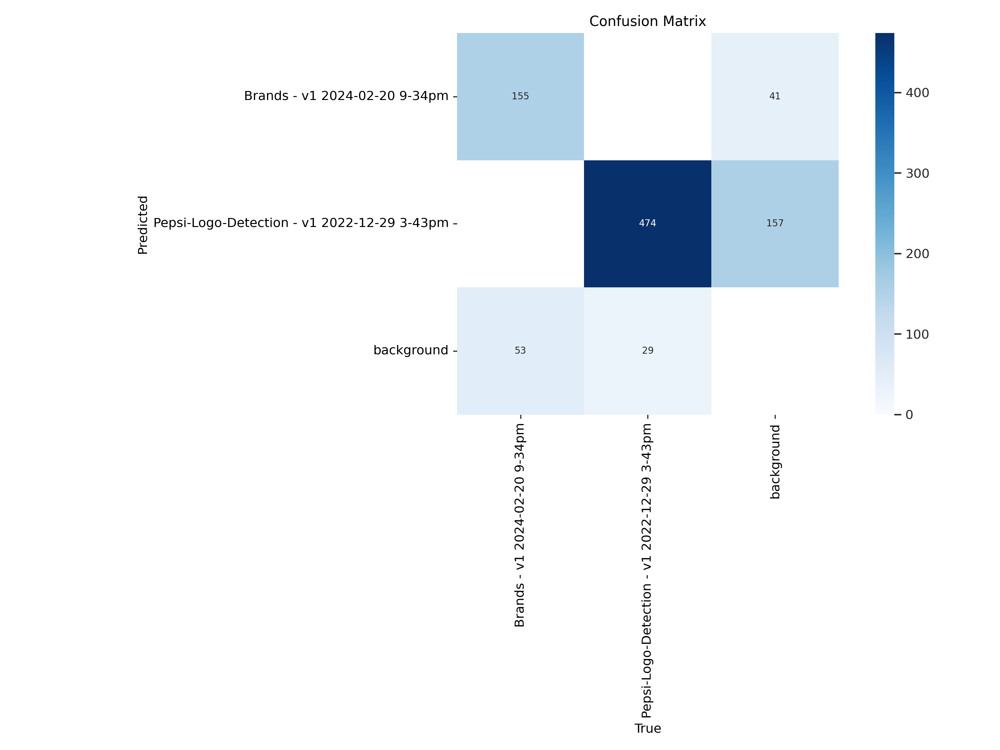

In [ ]:
from IPython.display import Image
Image(filename=f"/content/runs/detect/train/confusion_matrix.png", width=600)

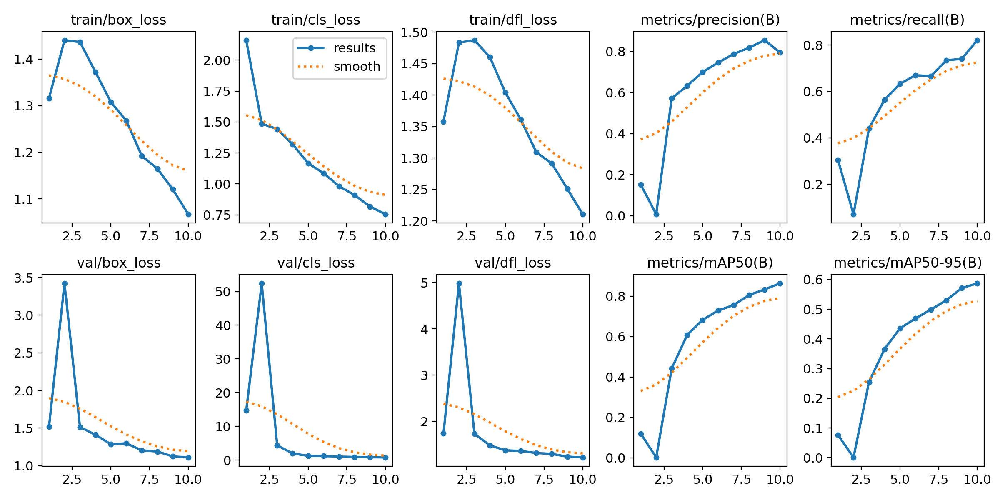

In [ ]:
from IPython.display import Image
Image(filename=f"/content/runs/detect/train/results.png", width=600)

In [ ]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.2.67 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/pc-1/valid/labels.cache... 347 images, 0 backgrounds, 0 corrupt: 100% 347/347 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 22/22 [00:11<00:00,  1.86it/s]
                   all        347        711      0.796      0.821      0.862      0.588
Brands - v1 2024-02-20 9-34pm        100        208      0.823      0.721      0.817      0.508
Pepsi-Logo-Detection - v1 2022-12-29 3-43pm        247        503      0.769       0.92      0.907      0.667
Speed: 1.1ms preprocess, 19.8ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.5 source={dataset.location}/test/images

Ultralytics YOLOv8.2.67 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs

image 1/103 /content/pc-1/test/images/137569334_188026993008620_8654146121654094567_n_jpg.rf.ee3410f1cd5432d5c0d80583a10e4704.jpg: 640x640 1 Brands - v1 2024-02-20 9-34pm, 37.1ms
image 2/103 /content/pc-1/test/images/242122665_588313415656096_5787441337136846661_n_jpg.rf.d8fda1395fb0e95e14f3efe515277fa6.jpg: 640x640 3 Brands - v1 2024-02-20 9-34pms, 37.1ms
image 3/103 /content/pc-1/test/images/242512310_388036629605349_1966097672522818581_n_jpg.rf.c71334166a1bb77744be6c78b2888b3f.jpg: 640x640 (no detections), 37.0ms
image 4/103 /content/pc-1/test/images/242949891_375663417439812_1957518147901674671_n_jpg.rf.d883babb23a0ac046eae7d2c5a35c337.jpg: 640x640 1 Brands - v1 2024-02-20 9-34pm, 35.2ms
image 5/103 /content/pc-1/test/images/243545760_846705629378509_1995028528943802165_n_jpg.rf.da859f064a168fcd2ba27940d8a81637.jp

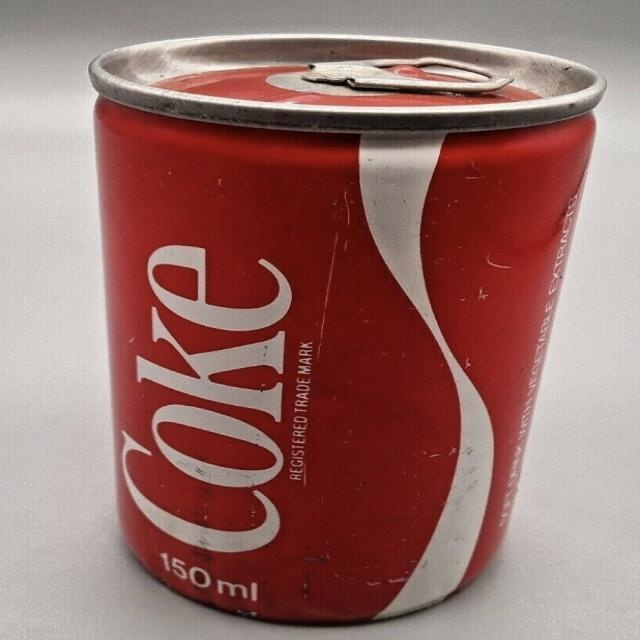

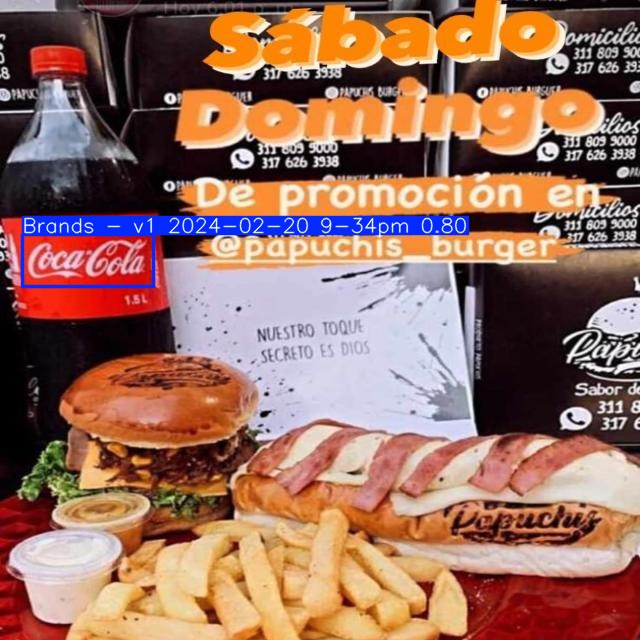

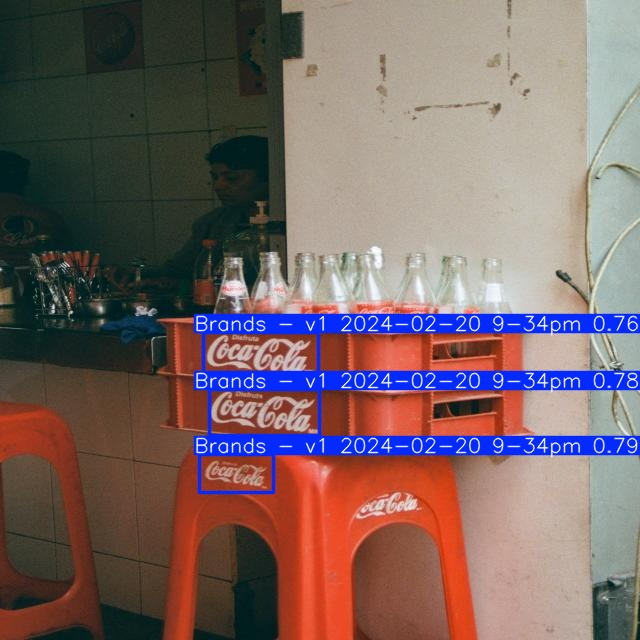

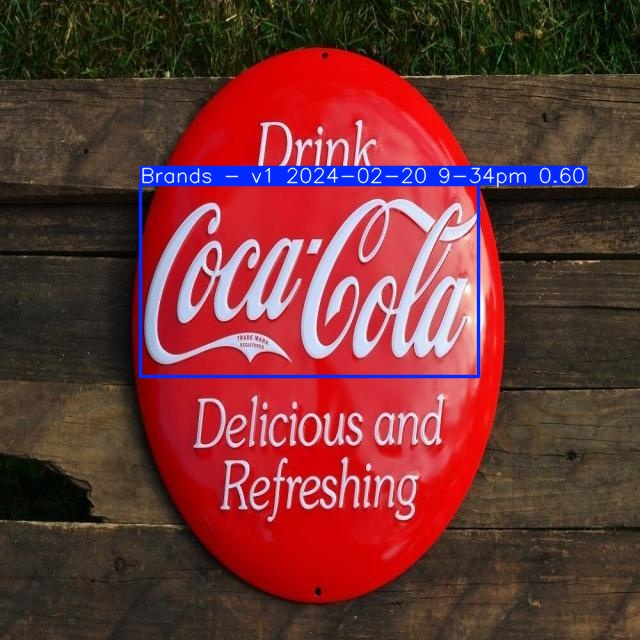

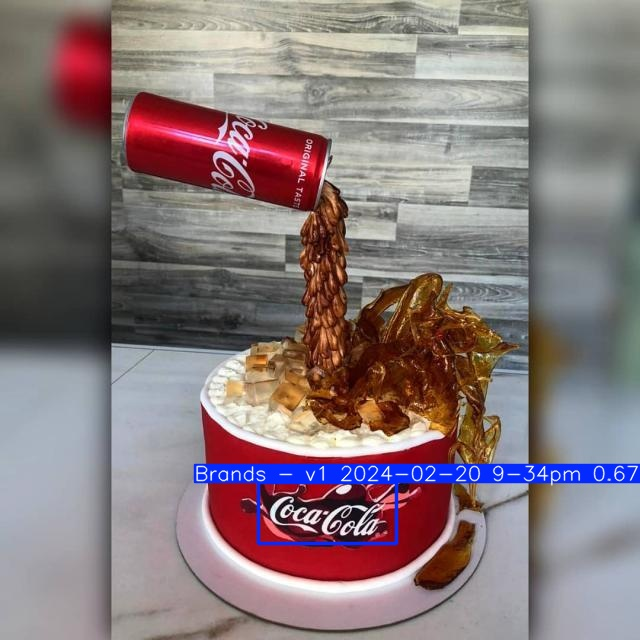

...

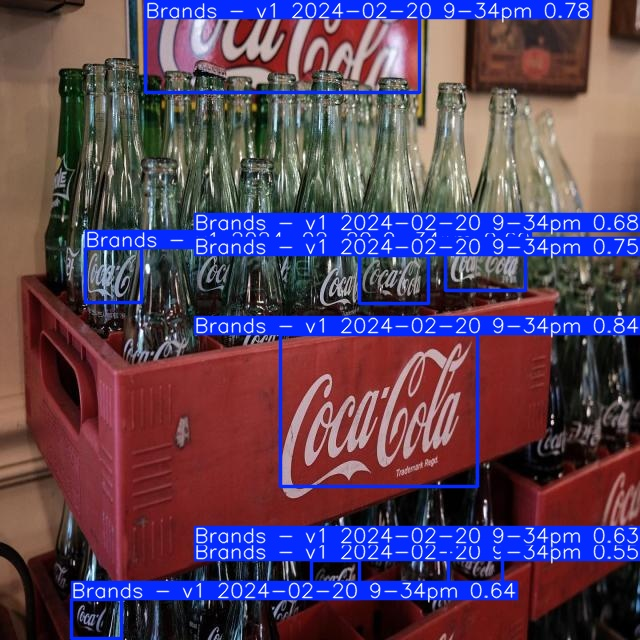

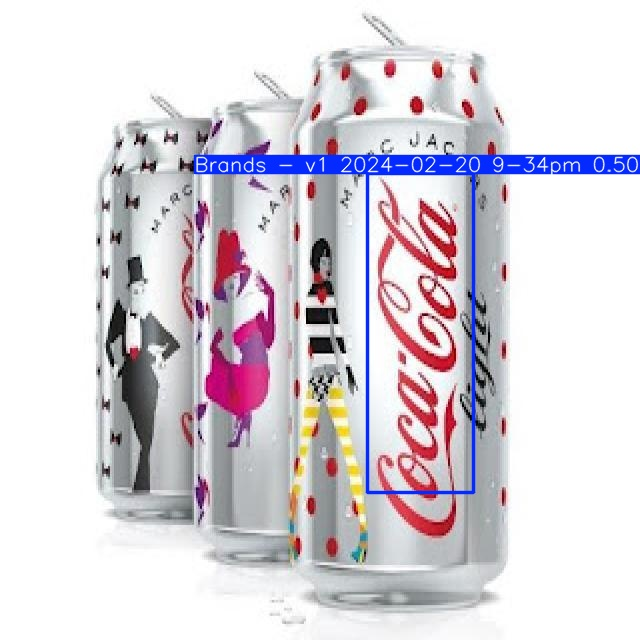

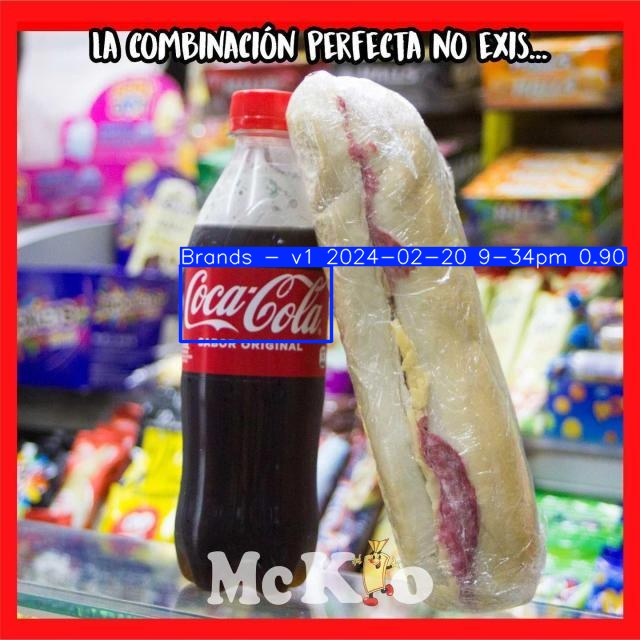

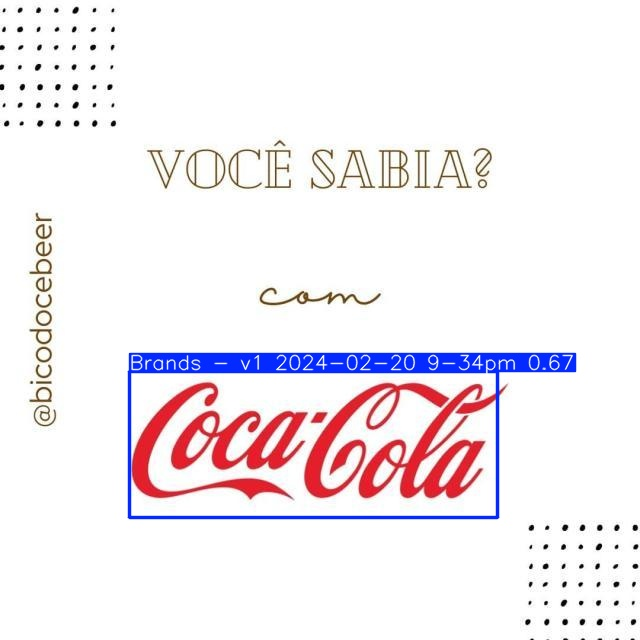

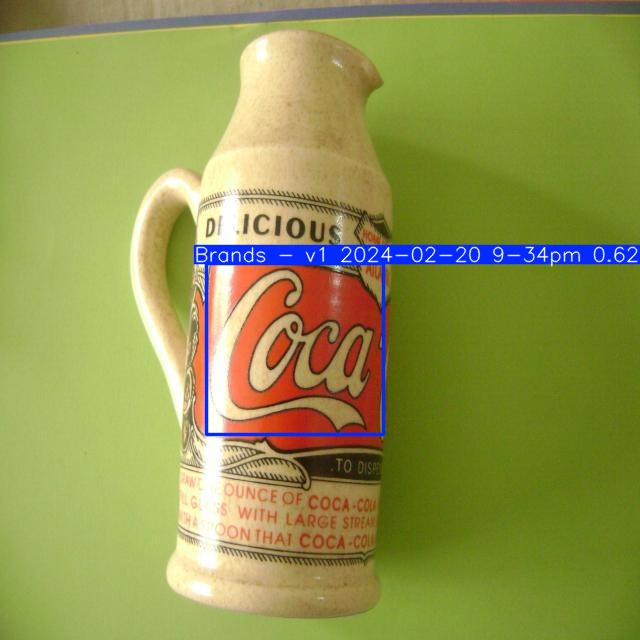

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob('/content/runs/detect/predict/*.jpg'):
      display(Image(filename=image_path, width=600))
      print("\n")